# Image process project 
##**Fourier transforms and image mosaicing**
The purpose of this assignment is to experiment with the use of the Fourier transform and to use it for image registration and filtering. A small system that automatically creates a mosaic from a small set of overlapping input images was built.

Basic set up

In [1]:
from skimage import io
from skimage import color
from skimage import exposure
from skimage import transform
from skimage.segmentation import flood, flood_fill

import matplotlib.pyplot as plt
import numpy as np 
import os

os.chdir("drive/MyDrive/Colab Notebooks/project3")
# Function for converting rgb to grayscale, value range from 0 to 255
def color2gray(img):
    weights = [.3, .6, .1]
    return np.dot(img[...,:3], weights)

# Function for converting rgb to grayscale, value range from 0 to 1
def color2gray_1(img):
    weights = [.3, .6, .1]
    return np.dot(img[...,:3], weights)/256

# helper function
def MSE(img1,img2):
  return ((img1-img2)**2).mean()

# These two padding functions will make the image width and height the same and its value will be 2^n
def zeros_pad(img):
  width = int(np.power(2,np.ceil(np.log2(img.shape[0]))))
  height = int(np.power(2,np.ceil(np.log2(img.shape[1]))))
  # Make square
  if width>height:
    height = width
  else:
    width = height
  shapes = (width,height)
  output = np.zeros(shapes)
  for x in range(img.shape[0]):
    for y in range(img.shape[1]):
      output[x][y] = img[x][y]
  return output

def average_pad(img):
  width = int(np.power(2,np.ceil(np.log2(img.shape[0]))))
  height = int(np.power(2,np.ceil(np.log2(img.shape[1]))))
  # Make square
  if width>height:
    height = width
  else:
    width = height
  shapes = (width,height)
  avg = img.mean()
  output = np.zeros(shapes)
  for x in range(img.shape[0]):
    for y in range(img.shape[1]):
      output[x][y] = avg
  for x in range(img.shape[0]):
    for y in range(img.shape[1]):
      output[x][y] = img[x][y]
  return output

###Image reading
For FFT, we test different kinds of images, like landscope, cats, cells, artwork

(549, 976, 3)


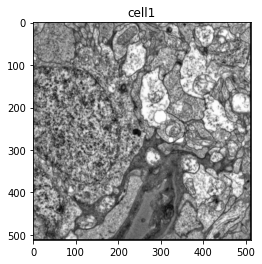

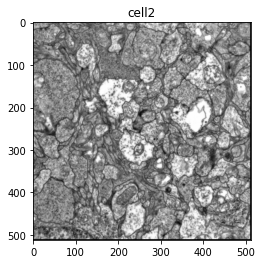

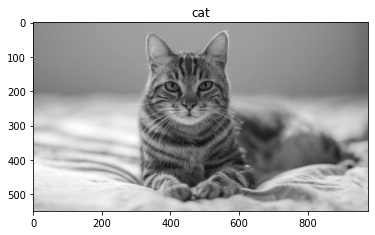

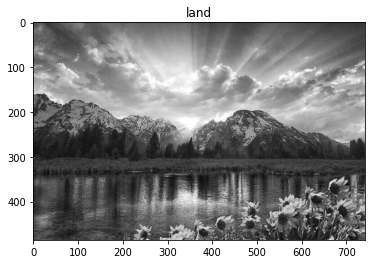

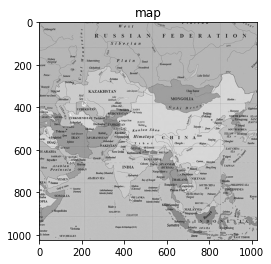

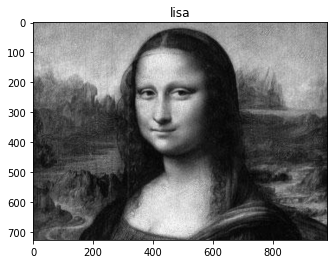

In [2]:
# Read an image 
cell1 = io.imread("0001.000.png")
cell1 = cell1/256
cell1 = zeros_pad(cell1)

cell2 = io.imread("0001.001.png")
cell2 = cell2/256
cell2 = zeros_pad(cell2)

cat = io.imread("cat.png")
print(cat.shape)
cat = color2gray_1(cat)

land = io.imread("land.jpg")
land = color2gray_1(land)

map = io.imread("map.jpg")
map = color2gray_1(map)

lisa = io.imread("mona-lisa.jpg")
lisa = color2gray(lisa)

#img = color2gray_1(img)
#img2 = color2gray_1(img2)

plt.imshow(cell1,cmap="gray")
plt.title("cell1")
plt.show()

plt.imshow(cell2,cmap="gray")
plt.title("cell2")
plt.show()

plt.imshow(cat,cmap="gray")
plt.title("cat")
plt.show()

plt.imshow(land,cmap="gray")
plt.title("land")
plt.show()

plt.imshow(map,cmap="gray")
plt.title("map")
plt.show()

plt.imshow(lisa,cmap="gray")
plt.title("lisa")
plt.show()

## Procedure for the FFT
* Apply FFT to the image
* Shift to the center
* Take the absoulte value
* Take the log
* Plot the image 

In [3]:
def fft_operation(img):
  fft_img = np.fft.fft2(img)
  fft_img_shift = np.fft.fftshift(fft_img)
  #plt.title(title)
  #plt.imshow(np.log(abs(fft_img_shift)), cmap='gray');
  #plt.show()
  return np.log(abs(fft_img_shift))

## Low pass filter
  Box filter was used

In [4]:
def low_pass(img,n,input_space_domain = True,output_space_domain = False):
  # Create a box filter
  rect = np.zeros(img.shape)
  width = img.shape[0]
  height = img.shape[1]

  # Adjust the n size
  while(n>width/2 or n>height/2):
    n//=2
  for x in range((int)(width/2-n),(int)(width/2+n)):
    for y in range((int)(height/2-n),(int)(height/2+n)):
      rect[x][y]=1
  fft_img1 = img
  if(input_space_domain):
    fft_img1 = np.fft.fft2(img)
  
  fft_img_shift = np.fft.fftshift(fft_img1)
  fft_img2 = np.fft.fft2(rect)

  convolution = np.multiply(fft_img_shift,rect)
  unshift = np.fft.ifftshift(convolution)
  space = np.fft.ifft2(unshift)
  space = np.real(space)
  if output_space_domain:
    return space
  else:
    return np.log(abs(convolution))
  
#space = low_pass(img,20)
#plt.imshow(space, cmap='gray');

##Compare the image in frequency domain and the image in frequency domain after low pass filter

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: RuntimeWarning: divide by zero encountered in log


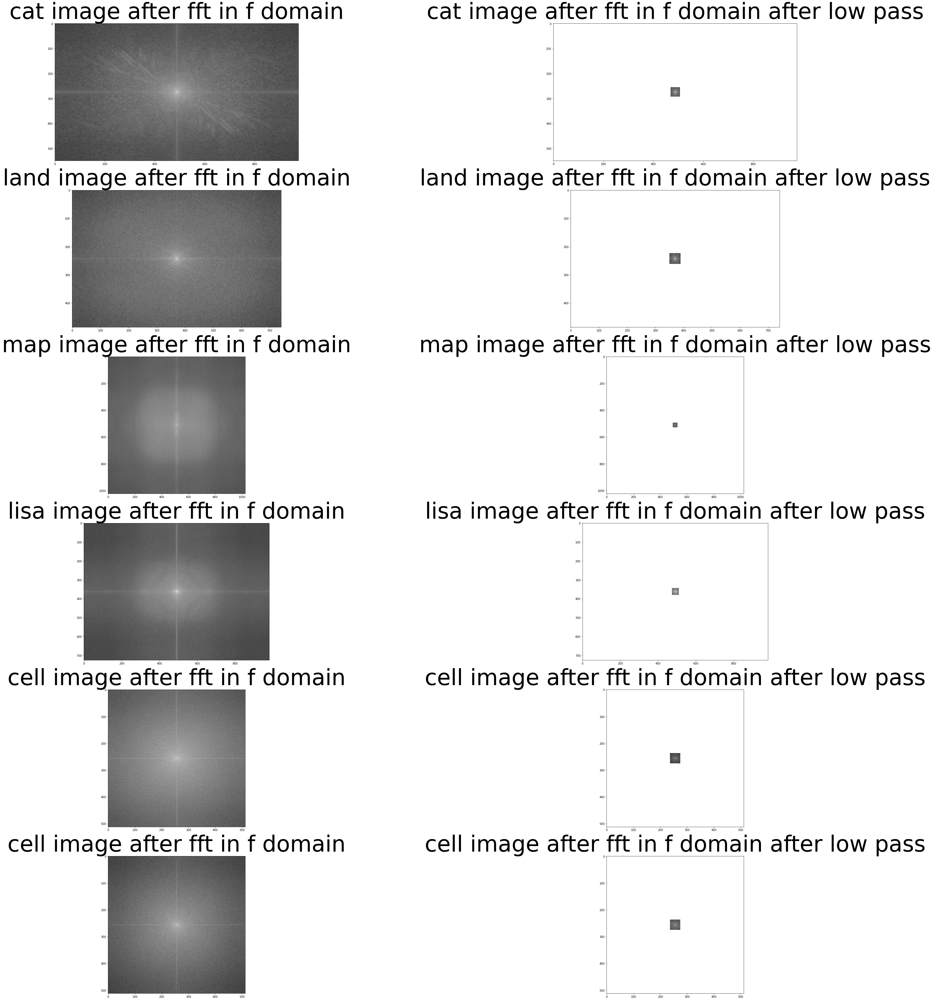

In [5]:
fig, ax = plt.subplots(nrows=6, ncols=2, figsize=(50, 50))#, sharex=True,sharey=True)

plt.gray()

ax[0, 0].imshow(fft_operation(cat))
ax[0, 0].set_title("cat image after fft in f domain",fontdict = {'fontsize':80})
ax[0, 1].imshow(low_pass(cat,20,input_space_domain = True,output_space_domain=False))
ax[0, 1].set_title("cat image after fft in f domain after low pass",fontdict = {'fontsize':80})

ax[1, 0].imshow(fft_operation(land))
ax[1, 0].set_title("land image after fft in f domain",fontdict = {'fontsize':80})
ax[1, 1].imshow(low_pass(land,20,input_space_domain = True,output_space_domain=False))
ax[1, 1].set_title("land image after fft in f domain after low pass",fontdict = {'fontsize':80})

ax[2, 0].imshow(fft_operation(map))
ax[2, 0].set_title("map image after fft in f domain",fontdict = {'fontsize':80})
ax[2, 1].imshow(low_pass(map,20,input_space_domain = True,output_space_domain=False))
ax[2, 1].set_title("map image after fft in f domain after low pass",fontdict = {'fontsize':80})

ax[3, 0].imshow(fft_operation(lisa))
ax[3, 0].set_title("lisa image after fft in f domain",fontdict = {'fontsize':80})
ax[3, 1].imshow(low_pass(lisa,20,input_space_domain = True,output_space_domain=False))
ax[3, 1].set_title("lisa image after fft in f domain after low pass",fontdict = {'fontsize':80})

ax[4, 0].imshow(fft_operation(cell1))
ax[4, 0].set_title("cell image after fft in f domain",fontdict = {'fontsize':80})
ax[4, 1].imshow(low_pass(cell1,20,input_space_domain = True,output_space_domain=False))
ax[4, 1].set_title("cell image after fft in f domain after low pass",fontdict = {'fontsize':80})

ax[5, 0].imshow(fft_operation(cell2))
ax[5, 0].set_title("cell image after fft in f domain",fontdict = {'fontsize':80})
ax[5, 1].imshow(low_pass(cell2,20,input_space_domain = True,output_space_domain=False))
ax[5, 1].set_title("cell image after fft in f domain after low pass",fontdict = {'fontsize':80})
fig.tight_layout()
plt.show()
#cell1_f_domain = fft_operation(cell1,"cell1")

After the shifting, the brightest part will shift from the corners to the center. In frequency domain, only map image seems darker a little bit due to the darkness of the orginal image. After applying a low pass filter, a box of width 20 was chosen from the middle. Since the filter is within the frequency domain, so all the frequency with high value will be set to 0, which is the reason why we see white sections around the center.

## Compare the image in space domain and the image in space domain after low pass filter

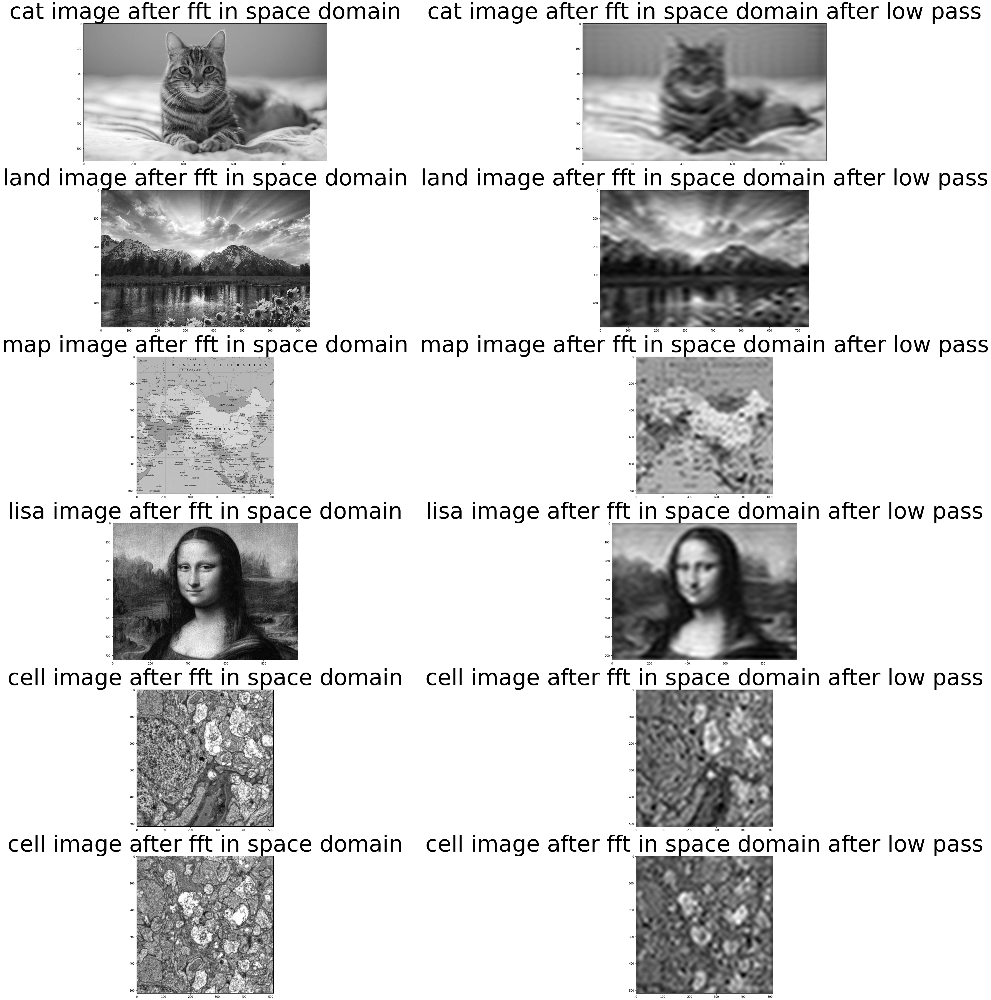

In [6]:
fig, ax = plt.subplots(nrows=6, ncols=2, figsize=(50, 50))#, sharex=True,sharey=True)

plt.gray()

ax[0, 0].imshow(cat)
ax[0, 0].set_title("cat image after fft in space domain",fontdict = {'fontsize':80})
ax[0, 1].imshow(low_pass(cat,20,input_space_domain = True,output_space_domain=True))
ax[0, 1].set_title("cat image after fft in space domain after low pass",fontdict = {'fontsize':80})

ax[1, 0].imshow(land)
ax[1, 0].set_title("land image after fft in space domain",fontdict = {'fontsize':80})
ax[1, 1].imshow(low_pass(land,20,input_space_domain = True,output_space_domain=True))
ax[1, 1].set_title("land image after fft in space domain after low pass",fontdict = {'fontsize':80})

ax[2, 0].imshow(map)
ax[2, 0].set_title("map image after fft in space domain",fontdict = {'fontsize':80})
ax[2, 1].imshow(low_pass(map,20,input_space_domain = True,output_space_domain=True))
ax[2, 1].set_title("map image after fft in space domain after low pass",fontdict = {'fontsize':80})

ax[3, 0].imshow(lisa)
ax[3, 0].set_title("lisa image after fft in space domain",fontdict = {'fontsize':80})
ax[3, 1].imshow(low_pass(lisa,20,input_space_domain = True,output_space_domain=True))
ax[3, 1].set_title("lisa image after fft in space domain after low pass",fontdict = {'fontsize':80})

ax[4, 0].imshow(cell1)
ax[4, 0].set_title("cell image after fft in space domain",fontdict = {'fontsize':80})
ax[4, 1].imshow(low_pass(cell1,20,input_space_domain = True,output_space_domain=True))
ax[4, 1].set_title("cell image after fft in space domain after low pass",fontdict = {'fontsize':80})

ax[5, 0].imshow(cell2)
ax[5, 0].set_title("cell image after fft in space domain",fontdict = {'fontsize':80})
ax[5, 1].imshow(low_pass(cell2,20,input_space_domain = True,output_space_domain=True))
ax[5, 1].set_title("cell image after fft in space domain after low pass",fontdict = {'fontsize':80})
fig.tight_layout()
plt.show()

Overall, a low pass filter gives a blur effect on all the images. The blur intensity was dertermined by the n (width of box filter). The following images shows a difference in n.

Text(0.5, 1.0, 'lisa image after fft in space domain after low pass with n=20')

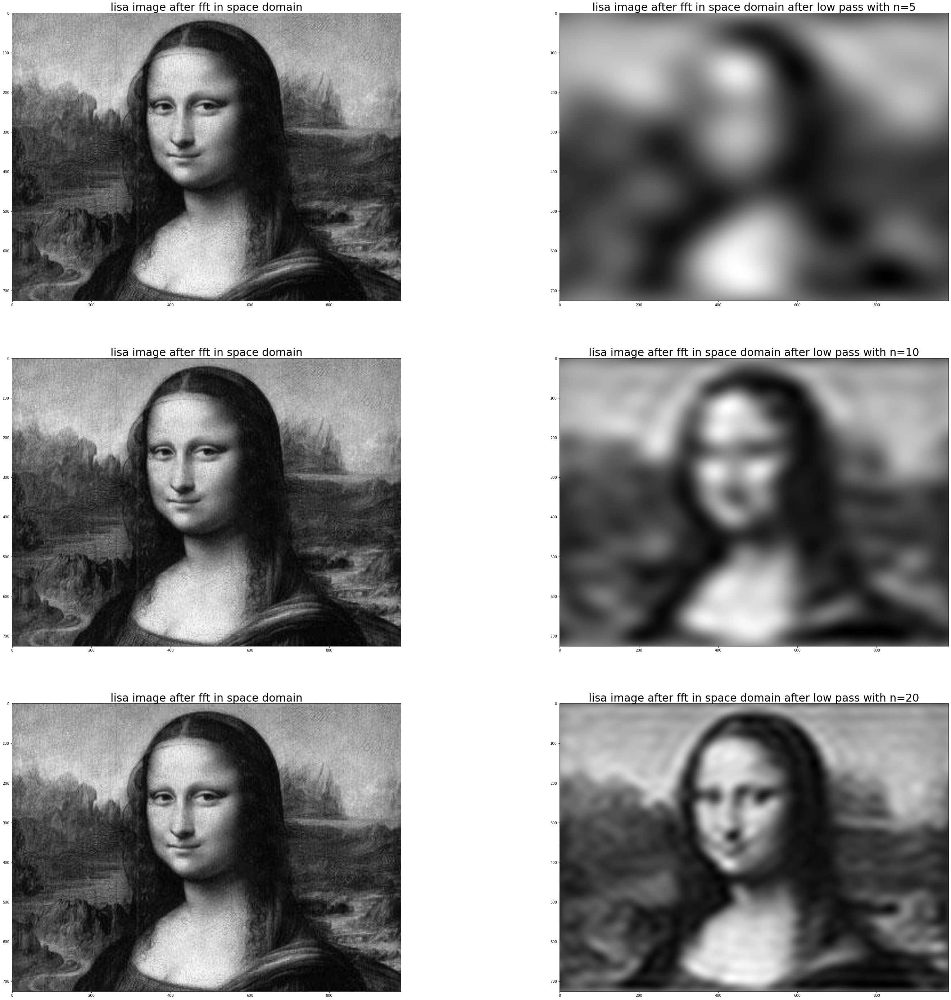

In [7]:
fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(50, 50))#, sharex=True,sharey=True)

plt.gray()

ax[0, 0].imshow(lisa)
ax[0, 0].set_title("lisa image after fft in space domain",fontdict = {'fontsize':30})
ax[0, 1].imshow(low_pass(lisa,5,input_space_domain = True,output_space_domain=True))
ax[0, 1].set_title("lisa image after fft in space domain after low pass with n=5",fontdict = {'fontsize':30})

ax[1, 0].imshow(lisa)
ax[1, 0].set_title("lisa image after fft in space domain",fontdict = {'fontsize':30})
ax[1, 1].imshow(low_pass(lisa,10,input_space_domain = True,output_space_domain=True))
ax[1, 1].set_title("lisa image after fft in space domain after low pass with n=10",fontdict = {'fontsize':30})

ax[2, 0].imshow(lisa)
ax[2, 0].set_title("lisa image after fft in space domain",fontdict = {'fontsize':30})
ax[2, 1].imshow(low_pass(lisa,20,input_space_domain = True,output_space_domain=True))
ax[2, 1].set_title("lisa image after fft in space domain after low pass with n=20",fontdict = {'fontsize':30})

## Peak finding
  This section cotains two algorthim. A simple one is finding the peak in the correlation image and return that pair. A more complex version will check the MSE of all the pair which correspond value larger than a threshold. Then return the min MSE pair.

In [8]:

def MSE_check(img,img1,img2,threshold):
  xlist,ylist=np.where(img>threshold)
  
  min_MSE = 1000
  x = -1
  y = -1
  for i in range(len(xlist)):
    #print(xlist[i],ylist[i])
    mse_pair,pos = overlap(xlist[i],ylist[i],img1,img2)
    if mse_pair<min_MSE:
      min_MSE = mse_pair
      x = xlist[i]
      y = ylist[i]
  #print("min_MSE ",min_MSE)
  if(min_MSE<0.1):
    return (x,y,pos)
  else:
    return (-1,-1,-1)

# This function perform a overlap MSE check
def overlap(x,y,img1,img2):
  width = img1.shape[0]
  height = img1.shape[1]
  if x==0:
    x=1
  if y==0:
    y=1
  # Check the four sections and get the min MSE
  leftup   =  MSE(img1[0:x,0:y],img2[width-x:width,height-y:height])
  rightup_  =  MSE(img1[x:width,0:y],img2[0:width-x,height-y:height])
  leftdown  =  MSE(img1[0:x,y:height],img2[width-x:width,0:height-y])
  rightdown_ =  MSE(img1[x:width,y:height],img2[0:width-x,0:height-y])

  part_list = [leftup,rightup_,leftdown,rightdown_]
  return (min(part_list),np.argmin(part_list))

# Compute the phase correlation between two images of the same size
def phase_correlation(img1,img2,simple = True):
  F = np.fft.fft2(img1)
  G = np.fft.fft2(img2)
  right_side = (F.conj()*G)/(np.absolute(F.conj()*G))
  
  img = low_pass(right_side,20,input_space_domain = False,output_space_domain = True)
  width = img.shape[0]
  plt.imshow(img, cmap='gray')
  plt.title("Phase correlation image mapping")
  # Find the peak value and its index 
  peak_value = np.max(img)

  # If the threshold value is smaller than a threshold, then return negative
  threshold= 0.0005

  # Simple version just check the peak larger than a threshold
  # Complex version performs a MSE check on the overlap region for all the img point larger than a threshold

  if simple:
    if(peak_value<threshold):
      print(peak_value,threshold)
      print("No overlap for image1 and image2")
      return (-1,-1,-1)
    else:
      indexs = np.argmax(img)
      x = indexs//width
      y = indexs-x*width
      return (x,y,peak_value)
  else:
    x,y,pos = MSE_check(img,img1,img2,threshold*1.5)
    # Pos here is the position img1 (target) relative to img2 (new added image)
    
    return(x,y,peak_value)

This image shows the simple version algorthim: finding the peak (brightest part in the image). As we can see, the brightest part was located in around 370, left or right corner. 

Shift offset:  377 0
Peak value  0.001260954323781619


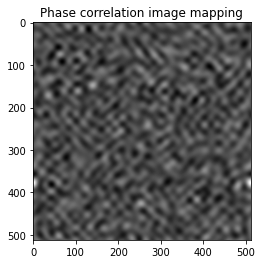

In [9]:
x,y,peak = phase_correlation(cell1,cell2)
print("Shift offset: ",x,y)
print("Peak value ",peak)

After performing MSE check, the final peak shifted a few pixels. In actual implmentation, threshold is an important parameter to determine. Since we only want to check the MSE in that bright region not all of the images. 

Shift offset:  378 511
Peak value  0.001260954323781619


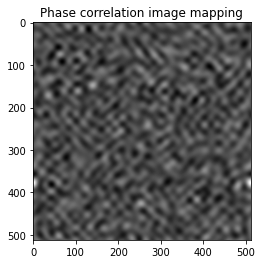

In [10]:
x,y,peak = phase_correlation(cell1,cell2,simple=False)
print("Shift offset: ",x,y)
print("Peak value ",peak)

## Mosaic Building
  * Read picture names from a txt file
  * Assume the first one is target, add the rest of images into the main canvas
  * Loop throught the four sections and find the min MSE
  * Loop throught existing images and find the best fit neighbrood
  

In [11]:
# A helper function to add one image to the canvas based on index
def add_image(canvas,x,y,img):
  width = img.shape[1]
  height = img.shape[0]
  for i in range(x-width//2,x+width//2):
    for j in range(y-height//2,y+height//2):
      canvas[i][j] = img[i+width//2-x][j+height//2-y]
  return canvas

# Prune zeros on the final canvas
def cutoff_zeros(img):
  # argwhere will give you the coordinates of every non-zero point
  true_points = np.argwhere(img)
  # take the smallest points and use them as the top left of your crop
  top_left = true_points.min(axis=0)
  # take the largest points and use them as the bottom right of your crop
  bottom_right = true_points.max(axis=0)
  out = img[top_left[0]:bottom_right[0]+1,  # plus 1 because slice isn't
            top_left[1]:bottom_right[1]+1]  # inclusive
  return out
# A helper method copy from https://stackoverflow.com/questions/39465812/how-to-crop-zero-edges-of-a-numpy-array

In [12]:
def masic_making(filename):
  # Using readlines()
  file1 = open(filename, 'r')
  pictures = file1.readlines()

  if(len(pictures)==0):
    print("no files")

  # cut off \n
  for x in range(len(pictures)):
    pictures[x] = pictures[x][:-1]

  # The base target image
  target = io.imread(pictures[0])
  target = target/256
  width = target.shape[1]
  height = target.shape[0]
  number_of_pictures = len(pictures)

  # Add first image (target) to the canvas
  canvas = np.zeros((2*width*number_of_pictures,2*height*number_of_pictures))
  canvas = add_image(canvas,width*number_of_pictures,height*number_of_pictures,target)
  previous_list = []
  previous_list.append((width*number_of_pictures,height*number_of_pictures,target))
  
  # This loop add images to the canvas
  for i in range(1,number_of_pictures):
    max_peak_value = 0
    max_index = 100
    current_img = io.imread(pictures[i])
    current_img = current_img/256
    current_x,current_y=(0,0)
    # This loop finds the best fit image to adjoin
    for j in range(len(previous_list)):

      # These are the coordinate on the canvas
      absx = previous_list[j][0]
      absy = previous_list[j][1]
      previous_img = previous_list[j][2]
      
      # Do the correlation 
      x,y,peak = phase_correlation(previous_img,current_img,True)
      if x==-1 or y==-1: # If they clearly not overlap
        continue
      
      # Get one possible value
      if peak>max_peak_value:
        max_peak_value = peak
        max_index = j
        current_x = x
        current_y = y

    width = current_img.shape[0]
    height = current_img.shape[1]

    # Check the four sections and get the min MSE
    img1 = current_img
    img2 = previous_list[max_index][2]
    a = current_x
    b = current_y
    
    # It will raise divide by zero issues, just adding one offset
    if a==0:
      a=1
    if b==0:
      b=1
    leftup   =  MSE(img1[0:a,0:b],img2[width-a:width,height-b:height])
    leftdown  =  MSE(img1[a:width,0:b],img2[0:width-a,height-b:height])
    rightup_  =  MSE(img1[0:a,b:height],img2[width-a:width,0:height-b])
    rightdown_ =  MSE(img1[a:width,b:height],img2[0:width-a,0:height-b])

    part_list = [leftup,leftdown,rightup_,rightdown_]
    pos = np.argmin(part_list)

    absx = previous_list[max_index][0]
    absy = previous_list[max_index][1]
    xcor = current_x
    ycor = current_y
    
    # Find the absoulte coordinate based on relative position and shift
    if pos == 3:  #new image on the top left of the previous
      absx -=  xcor
      absy -=  ycor
    elif pos == 2: #new image on the buttom left of the previous
      absx += (width - xcor)
      absy -= ycor
    elif pos == 1: #new image on the top right of the previous
      absx -= xcor
      absy += (width - ycor)
    else:       #new image on the right buttom of the previous
      absx += (width - xcor)
      absy += (width - ycor)
    
    canvas = add_image(canvas,absx,absy,current_img)
    print("add ",i," image")
    previous_list.append((absx,absy,current_img))

  canvas = cutoff_zeros(canvas)
  io.imsave("canvas.png",canvas)
  plt.title("Final mosaic canvas")
  plt.imshow(canvas,cmap="gray")

In [13]:
import random
def generate_images(main_image,num,size):

  #path = os.getcwd()
  #!mkdir testset
  #os.chdir("./testset")
  file1 = open("test.txt", 'a')

  width = main_image.shape[0]
  for i in range(num):
    x = random.randint(1, width)
    y = random.randint(1, width)
    while x+size>width or y+size>width:
      x = random.randint(1, width)
      y = random.randint(1, width)
    temp = main_image[x:x+size,y:y+size]
    img_name = "test"+str(i)+".png"
    print(img_name)
    #print(temp)
    img_name_with_line = img_name+'\n'
    io.imsave(img_name,temp)
    file1.write(img_name_with_line)
  file1.write('\n')
  file1.close()
  #os.chdir(path)

The Lisa example shows 12 images mosaic together. All the images are random chosen so the buttom right seems missing content. But the rest of the images looks pretty good

add  1  image
add  2  image
add  3  image
add  4  image
add  5  image
add  6  image
add  7  image
add  8  image
add  9  image
add  10  image
add  11  image


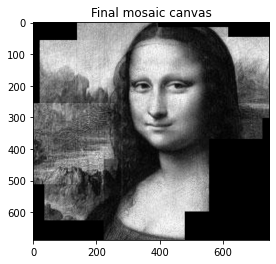

In [15]:
masic_making("lisa/lisa.txt")

add  1  image
add  2  image
add  3  image
add  4  image
add  5  image


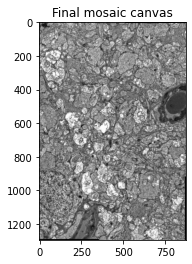

In [14]:
masic_making("cell_images/read_cells.txt")

The cell example is pretty straightforward. Six cell images mosaic together